In [1]:
import pandas as pd
from json import load
import urllib.request, json 
from pandas.io.json import json_normalize
import seaborn as sns
import pylab as plt
import multiprocessing as mp
import numpy as np
from sklearn.manifold import TSNE
from pathlib import Path
%matplotlib inline
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('max_colwidth',500)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
from urllib.error import HTTPError
from time import sleep

The TSNE projections can be time consuming to calculate, and since we'd like to explore multiple perplexities, we'll use ipyparallel to speed things up

In [2]:
import ipyparallel as ipp
rc = ipp.Client()
dview = rc[:]

# Look at T-Statistic Neighbor Embedding of QC Metrics
Scikit-Learns TSNE function: http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
TSNE analysis suggested by Satrajit Ghosh

## T1w TSNE

In [3]:
df_t1w_unique = pd.read_csv('t1w_datalad_and_mriqc.csv', low_memory=False)

In [4]:
def run_tsne(pp):
    from sklearn.manifold import TSNE
    res = TSNE(n_iter=5000, perplexity=pp).fit_transform(Xnn)
    return res

In [14]:
more_metacols = ['dataset',
 'hash_HPC',
 'path_HPC',
 'dataset_dl',
 'subdataset_dl',
 'subdataset',
 'dataset_lr',
 'hashing_algo']

In [7]:
dl_df = pd.read_csv('datalad_metadata.csv', low_memory=False)


In [15]:
# Split up collumns
metric_columns = ['cjv',
                  'cnr',
                  'efc',
                  'fber',
                  'fwhm_avg',
                  'fwhm_x',
                  'fwhm_y',
                  'fwhm_z',
                  'icvs_csf',
                  'icvs_gm',
                  'icvs_wm',
                  'inu_med',
                  'inu_range',
                  'qi_1',
                  'qi_2',
                  'rpve_csf',
                  'rpve_gm',
                  'rpve_wm',
                  'size_x',
                  'size_y',
                  'size_z',
                  'snr_csf',
                  'snr_gm',
                  'snr_total',
                  'snr_wm',
                  'snrd_csf',
                  'snrd_gm',
                  'snrd_total',
                  'snrd_wm',
                  'spacing_x',
                  'spacing_y',
                  'spacing_z',
                  'summary_bg_k',
                  'summary_bg_mad',
                  'summary_bg_mean',
                  'summary_bg_median',
                  'summary_bg_n',
                  'summary_bg_p05',
                  'summary_bg_p95',
                  'summary_bg_stdv',
                  'summary_csf_k',
                  'summary_csf_mad',
                  'summary_csf_mean',
                  'summary_csf_median',
                  'summary_csf_n',
                  'summary_csf_p05',
                  'summary_csf_p95',
                  'summary_csf_stdv',
                  'summary_gm_k',
                  'summary_gm_mad',
                  'summary_gm_mean',
                  'summary_gm_median',
                  'summary_gm_n',
                  'summary_gm_p05',
                  'summary_gm_p95',
                  'summary_gm_stdv',
                  'summary_wm_k',
                  'summary_wm_mad',
                  'summary_wm_mean',
                  'summary_wm_median',
                  'summary_wm_n',
                  'summary_wm_p05',
                  'summary_wm_p95',
                  'summary_wm_stdv',
                  'tpm_overlap_csf',
                  'tpm_overlap_gm',
                  'tpm_overlap_wm',
                  'wm2max']
meta_columns = ['_created',
               '_etag',
               '_id',
               '_updated',
               'bids_meta.modality',
               'bids_meta.subject_id',
               'provenance.md5sum',
               'provenance.settings.testing',
               'provenance.software',
               'provenance.version',
               'bids_meta.EchoTime',
               'bids_meta.FlipAngle',
               'bids_meta.MagneticFieldStrength',
               'bids_meta.Manufacturer',
               'bids_meta.ManufacturersModelName',
               'bids_meta.PhaseEncodingDirection',
               'bids_meta.RepetitionTime',
               'bids_meta.run_id',
               'bids_meta.session_id',
               'bids_meta.PulseSequenceType',
               'bids_meta.acq_id',
               'bids_meta.InversionTime',
               'bids_meta.AccelNumReferenceLines',
               'bids_meta.AccelerationFactorPE',
               'bids_meta.AcquisitionMatrix',
               'bids_meta.DeviceSerialNumber',
               'bids_meta.EchoTrainLength',
               'bids_meta.ImageType',
               'bids_meta.ImagingFrequency',
               'bids_meta.InPlanePhaseEncodingDirection',
               'bids_meta.MRAcquisitionType',
               'bids_meta.NumberOfAverages',
               'bids_meta.NumberOfPhaseEncodingSteps',
               'bids_meta.PatientPosition',
               'bids_meta.PercentPhaseFieldOfView',
               'bids_meta.PercentSampling',
               'bids_meta.PixelBandwidth',
               'bids_meta.ProtocolName',
               'bids_meta.ReceiveCoilName',
               'bids_meta.ScanOptions',
               'bids_meta.ScanningSequence',
               'bids_meta.SequenceName',
               'bids_meta.SequenceVariant',
               'bids_meta.SoftwareVersions',
               'bids_meta.TotalScanTimeSec',
               'bids_meta.TransmitCoilName',
               'bids_meta.VariableFlipAngleFlag',
               'provenance.email',
               'bids_meta.EffectiveEchoSpacing',
               'bids_meta.SliceEncodingDirection',
               'bids_meta.TotalReadoutTime',
               'bids_meta.ConversionSoftware',
               'bids_meta.ConversionSoftwareVersion',
               'bids_meta.InstitutionName',
               'bids_meta.InstitutionAddress',
               'bids_meta.PartialFourier',
               'bids_meta.PulseSequenceDetails',
               'bids_meta.ParallelReductionFactorInPlane',
               'bids_meta.TaskName',
               'bids_meta.ParallelAcquisitionTechnique',
               'provenance.warnings.large_rot_frame',
               'provenance.warnings.small_air_mask',
               'provenance.webapi_port',
               'provenance.webapi_url',
               'dataset_lr',
               'bids_meta.AcquisitionMatrixPE',
               'bids_meta.AcquisitionNumber',
               'bids_meta.AcquisitionTime',
               'bids_meta.ImageOrientationPatientDICOM',
               'bids_meta.InPlanePhaseEncodingDirectionDICOM',
               'bids_meta.Modality',
               'bids_meta.PercentPhaseFOV',
               'bids_meta.ProcedureStepDescription',
               'bids_meta.ReconMatrixPE',
               'bids_meta.SAR',
               'bids_meta.SeriesDescription',
               'bids_meta.SeriesNumber',
               'bids_meta.SliceThickness',
               'bids_meta.SpacingBetweenSlices',
               'bids_meta.StationName',
               'bids_meta.dcmmeta_affine',
               'bids_meta.dcmmeta_reorient_transform',
               'bids_meta.dcmmeta_shape',
               'bids_meta.dcmmeta_slice_dim',
               'bids_meta.dcmmeta_version',
               'bids_meta.global.const.AcquisitionMatrix',
               'bids_meta.global.const.AcquisitionNumber',
               'bids_meta.global.const.AcquisitionTime',
               'bids_meta.global.const.AngioFlag',
               'bids_meta.global.const.BitsAllocated',
               'bids_meta.global.const.BitsStored',
               'bids_meta.global.const.CardiacNumberOfImages',
               'bids_meta.global.const.Columns',
               'bids_meta.global.const.EchoNumbers',
               'bids_meta.global.const.EchoTime',
               'bids_meta.global.const.EchoTrainLength',
               'bids_meta.global.const.FlipAngle',
               'bids_meta.global.const.GroupLength_0X10_0X0',
               'bids_meta.global.const.GroupLength_0X18_0X0',
               'bids_meta.global.const.GroupLength_0X28_0X0',
               'bids_meta.global.const.GroupLength_0X40_0X0',
               'bids_meta.global.const.GroupLength_0X7FE0_0X0',
               'bids_meta.global.const.GroupLength_0X8_0X0',
               'bids_meta.global.const.HeartRate',
               'bids_meta.global.const.HighBit',
               'bids_meta.global.const.ImageOrientationPatient',
               'bids_meta.global.const.ImageType',
               'bids_meta.global.const.ImagedNucleus',
               'bids_meta.global.const.ImagesInAcquisition',
               'bids_meta.global.const.ImagingFrequency',
               'bids_meta.global.const.InPlanePhaseEncodingDirection',
               'bids_meta.global.const.InversionTime',
               'bids_meta.global.const.MRAcquisitionType',
               'bids_meta.global.const.MagneticFieldStrength',
               'bids_meta.global.const.Manufacturer',
               'bids_meta.global.const.ManufacturerModelName',
               'bids_meta.global.const.Modality',
               'bids_meta.global.const.NumberOfAverages',
               'bids_meta.global.const.PercentPhaseFieldOfView',
               'bids_meta.global.const.PercentSampling',
               'bids_meta.global.const.PhotometricInterpretation',
               'bids_meta.global.const.PixelBandwidth',
               'bids_meta.global.const.PixelRepresentation',
               'bids_meta.global.const.PixelSpacing',
               'bids_meta.global.const.PositionReferenceIndicator',
               'bids_meta.global.const.ProtocolName',
               'bids_meta.global.const.ReceiveCoilName',
               'bids_meta.global.const.ReconstructionDiameter',
               'bids_meta.global.const.ReferencedPerformedProcedureStepSequence',
               'bids_meta.global.const.ReferencedStudySequence',
               'bids_meta.global.const.RepetitionTime',
               'bids_meta.global.const.Rows',
               'bids_meta.global.const.SAR',
               'bids_meta.global.const.SamplesPerPixel',
               'bids_meta.global.const.ScanOptions',
               'bids_meta.global.const.ScanningSequence',
               'bids_meta.global.const.SequenceVariant',
               'bids_meta.global.const.SeriesDescription',
               'bids_meta.global.const.SeriesNumber',
               'bids_meta.global.const.SliceThickness',
               'bids_meta.global.const.SmallestImagePixelValue',
               'bids_meta.global.const.SoftwareVersions',
               'bids_meta.global.const.SpacingBetweenSlices',
               'bids_meta.global.const.SpecificCharacterSet',
               'bids_meta.global.const.StackID',
               'bids_meta.global.const.TriggerWindow',
               'bids_meta.global.const.VariableFlipAngleFlag',
               'bids_meta.global.slices.GroupLength_0X20_0X0',
               'bids_meta.global.slices.ImagePositionPatient',
               'bids_meta.global.slices.InStackPositionNumber',
               'bids_meta.global.slices.InstanceNumber',
               'bids_meta.global.slices.LargestImagePixelValue',
               'bids_meta.global.slices.SliceLocation',
               'bids_meta.global.slices.WindowCenter',
               'bids_meta.global.slices.WindowWidth',
               'bids_meta.global.slices.AcquisitionTime',
               'bids_meta.global.slices.ContentTime',
               'bids_meta.global.slices.GroupLength_0X28_0X0',
               'bids_meta.global.slices.GroupLength_0X8_0X0',
               'bids_meta.global.slices.SmallestImagePixelValue',
               'null_count',
               'action',
               'dsid',
               'metadata',
               'metadata__@context__@vocab',
               'metadata__annex__MRI',
               'metadata__annex__age',
               'metadata__annex__dcterms_format',
               'metadata__annex__diagnosis',
               'metadata__annex__distribution-restrictions',
               'metadata__annex__education',
               'metadata__annex__ethnicity',
               'metadata__annex__full_iq',
               'metadata__annex__handedness',
               'metadata__annex__key',
               'metadata__annex__marital_status',
               'metadata__annex__occupation',
               'metadata__annex__participant_id',
               'metadata__annex__performance_iq',
               'metadata__annex__project',
               'metadata__annex__session_count',
               'metadata__annex__session_id',
               'metadata__annex__sex',
               'metadata__annex__site_id',
               'metadata__annex__species',
               'metadata__annex__tag',
               'metadata__annex__verbal_iq',
               'metadata__bids__@context',
               'metadata__bids__AccelFactPE',
               'metadata__bids__AccelNumReferenceLines',
               'metadata__bids__AccelerationFactorPE',
               'metadata__bids__AcquisitionDateTime',
               'metadata__bids__AcquisitionDuration',
               'metadata__bids__AcquisitionMatrix',
               'metadata__bids__AcquisitionMatrixPE',
               'metadata__bids__AcquisitionMatrixText',
               'metadata__bids__AcquisitionNumber',
               'metadata__bids__AcquisitionTime',
               'metadata__bids__AcquisitionType',
               'metadata__bids__AngioFlag',
               'metadata__bids__BIDSVersion',
               'metadata__bids__BackgroundSuppression',
               'metadata__bids__BandwidthPerPixelPhaseEncode',
               'metadata__bids__BaseResolution',
               'metadata__bids__BodyPartExamined',
               'metadata__bids__Bolus',
               'metadata__bids__CalibrationImage',
               'metadata__bids__CalibrationImageTR',
               'metadata__bids__CardiacTriggerDelayTimes',
               'metadata__bids__CogAtlasID',
               'metadata__bids__CogPOID',
               'metadata__bids__CoilCombinationMethod',
               'metadata__bids__Columns',
               'metadata__bids__ConsistencyInfo',
               'metadata__bids__ConversionSoftware',
               'metadata__bids__ConversionSoftwareVersion',
               'metadata__bids__DerivedVendorReportedEchoSpacing',
               'metadata__bids__DeviceSerialNumber',
               'metadata__bids__DwellTime',
               'metadata__bids__ECHO',
               'metadata__bids__EPIFactor',
               'metadata__bids__EPI_Factor',
               'metadata__bids__EchoNumber',
               'metadata__bids__EchoTime',
               'metadata__bids__EchoTime1',
               'metadata__bids__EchoTime2',
               'metadata__bids__EchoTimes',
               'metadata__bids__EchoTrainLength',
               'metadata__bids__EffectiveEchoSpacing',
               'metadata__bids__ExcitationFlipAngle',
               'metadata__bids__FLipAngle',
               'metadata__bids__FieldOfView',
               'metadata__bids__FieldStrength',
               'metadata__bids__FlipAngle',
               'metadata__bids__GEImageTypeRIMPCode',
               'metadata__bids__HardcopyDeviceSoftwareVersion',
               'metadata__bids__ImageComments',
               'metadata__bids__ImageOrientationPatientDICOM',
               'metadata__bids__ImageSliceThickness',
               'metadata__bids__ImageType',
               'metadata__bids__ImagedNucleus',
               'metadata__bids__ImagingFrequency',
               'metadata__bids__InPlanePhaseEncodingDirection',
               'metadata__bids__InPlanePhaseEncodingDirectionDICOM',
               'metadata__bids__InflowTimes',
               'metadata__bids__InplanePhaseEncodingDirection',
               'metadata__bids__InstitutionAddress',
               'metadata__bids__InstitutionName',
               'metadata__bids__InstitutionalDepartmentName',
               'metadata__bids__Instructions',
               'metadata__bids__IntendedFor',
               'metadata__bids__InversionTime',
               'metadata__bids__KSpaceBlipDir',
               'metadata__bids__Labeling',
               'metadata__bids__License',
               'metadata__bids__LookLocker',
               'metadata__bids__MRAcquisition Type ',
               'metadata__bids__MRAcquisitionType',
               'metadata__bids__MagneticFieldStrength',
               'metadata__bids__Manufacturer',
               'metadata__bids__ManufacturerModelName',
               'metadata__bids__ManufacturersModelName',
               'metadata__bids__MatrixCoilMode',
               'metadata__bids__Modality',
               'metadata__bids__MultibandAccelerationFactor',
               'metadata__bids__MultibandAccellerationFactor',
               'metadata__bids__Name',
               'metadata__bids__NumberOfAverages',
               'metadata__bids__NumberOfEPIShots',
               'metadata__bids__NumberOfEchoes',
               'metadata__bids__NumberOfPhaseEncodingSteps',
               'metadata__bids__NumberOfSlices',
               'metadata__bids__NumberOfVolumesDiscardedByScanner',
               'metadata__bids__NumberOfVolumesDiscardedByUser',
               'metadata__bids__NumberShots',
               'metadata__bids__NumberofAverages',
               'metadata__bids__NumberofPhaseEncodingSteps',
               'metadata__bids__NumberofSlices',
               'metadata__bids__OrientationAngle',
               'metadata__bids__OriginalFunctionalRunIndex',
               'metadata__bids__PATModeText',
               'metadata__bids__ParallelAcquisitionTechnique',
               'metadata__bids__ParallelImagingReductionFactor',
               'metadata__bids__ParallelImagingReductionFactors',
               'metadata__bids__ParallelReductionFactorInPlane',
               'metadata__bids__ParellelReductionType',
               'metadata__bids__PartialFourier',
               'metadata__bids__PatientName',
               'metadata__bids__PatientPosition',
               'metadata__bids__PercentPhaseFOV',
               'metadata__bids__PercentPhaseFieldOfView',
               'metadata__bids__PercentPhaseFieldofView',
               'metadata__bids__PercentSampling',
               'metadata__bids__PhaseEncodingAxis',
               'metadata__bids__PhaseEncodingDirection',
               'metadata__bids__PhaseEncodingLines',
               'metadata__bids__PhaseEncodingSteps',
               'metadata__bids__PhaseOversampling',
               'metadata__bids__PhaseResolution',
               'metadata__bids__PhotometInterpret',
               'metadata__bids__PixelBandwidth',
               'metadata__bids__PixelSpacing',
               'metadata__bids__PreparationDirection',
               'metadata__bids__ProcedureStepDescription',
               'metadata__bids__ProtocolName',
               'metadata__bids__PulseSequenceDetails',
               'metadata__bids__PulseSequenceType',
               'metadata__bids__RealDwellTime',
               'metadata__bids__ReceiveCoilActiveElements',
               'metadata__bids__ReceiveCoilName',
               'metadata__bids__ReconMatrixPE',
               'metadata__bids__RefocusingFlipAngle',
               'metadata__bids__RepetitionTime',
               'metadata__bids__Rows',
               'metadata__bids__SAR',
               'metadata__bids__SATFatWaterBone',
               'metadata__bids__ScanDuration',
               'metadata__bids__ScanMode',
               'metadata__bids__ScanOptions',
               'metadata__bids__ScannerSoftwareVersionsPd',
               'metadata__bids__ScanningSequence',
               'metadata__bids__SequenceName',
               'metadata__bids__SequenceType',
               'metadata__bids__SequenceVariant',
               'metadata__bids__SeriesDate',
               'metadata__bids__SeriesDescription',
               'metadata__bids__SeriesNumber',
               'metadata__bids__SeriesTime',
               'metadata__bids__ShimSetting',
               'metadata__bids__SliceAcquisitionDirection',
               'metadata__bids__SliceEncodingDirection',
               'metadata__bids__SliceGap',
               'metadata__bids__SliceThickness',
               'metadata__bids__SliceTimeComputationMethod',
               'metadata__bids__SliceTiming',
               'metadata__bids__SliceTimingCalculationMethod',
               'metadata__bids__SliceTimingComputationMethod',
               'metadata__bids__SoftwareVersion',
               'metadata__bids__SoftwareVersions',
               'metadata__bids__SpacingBetweenSlices',
               'metadata__bids__StationName',
               'metadata__bids__StudyID',
               'metadata__bids__StudyTime',
               'metadata__bids__SubtractionType',
               'metadata__bids__TagControlOrdering',
               'metadata__bids__TaskDescription',
               'metadata__bids__TaskFullName',
               'metadata__bids__TaskInstructions',
               'metadata__bids__TaskName',
               'metadata__bids__TotalEpiReadoutTime',
               'metadata__bids__TotalReadoutTime',
               'metadata__bids__TotalScanTimeSec',
               'metadata__bids__TransmitCoilName',
               'metadata__bids__TransmittingCoil',
               'metadata__bids__TrueEchoSpacing',
               'metadata__bids__TxRefAmp',
               'metadata__bids__Units',
               'metadata__bids__VariableFlipAngle',
               'metadata__bids__VariableFlipAngleFlag',
               'metadata__bids__VascularSuppression',
               'metadata__bids__VendorReportedEchoSpacing',
               'metadata__bids__acq',
               'metadata__bids__acquisition',
               'metadata__bids__broken_volumes',
               'metadata__bids__class',
               'metadata__bids__dcmmeta_affine',
               'metadata__bids__dcmmeta_reorient_transform',
               'metadata__bids__dcmmeta_shape',
               'metadata__bids__dcmmeta_slice_dim',
               'metadata__bids__dcmmeta_version',
               'metadata__bids__dir',
               'metadata__bids__dummyScans',
               'metadata__bids__echo',
               'metadata__bids__fmap',
               'metadata__bids__missing_volumes',
               'metadata__bids__mod',
               'metadata__bids__modality',
               'metadata__bids__reconstruction',
               'metadata__bids__run',
               'metadata__bids__session',
               'metadata__bids__space',
               'metadata__bids__subject',
               'metadata__bids__task',
               'metadata__bids__type',
               'metadata__datalad_core__url',
               'metadata__nifti1__@context',
               'metadata__nifti1__aux_file',
               'metadata__nifti1__cal_max',
               'metadata__nifti1__cal_min',
               'metadata__nifti1__datatype',
               'metadata__nifti1__description',
               'metadata__nifti1__dim',
               'metadata__nifti1__freq_axis',
               'metadata__nifti1__intent',
               'metadata__nifti1__intent_name',
               'metadata__nifti1__magic',
               'metadata__nifti1__phase_axis',
               'metadata__nifti1__pixdim',
               'metadata__nifti1__qform_code',
               'metadata__nifti1__sform_code',
               'metadata__nifti1__sizeof_hdr',
               'metadata__nifti1__slice_axis',
               'metadata__nifti1__slice_duration',
               'metadata__nifti1__slice_end',
               'metadata__nifti1__slice_order',
               'metadata__nifti1__slice_start',
               'metadata__nifti1__spatial_resolution(mm)',
               'metadata__nifti1__t_unit',
               'metadata__nifti1__temporal_spacing(s)',
               'metadata__nifti1__toffset',
               'metadata__nifti1__vox_offset',
               'metadata__nifti1__xyz_unit',
               'parentds',
               'path',
               'query_matched',
               'refcommit',
               'status',
               'type',
               'hash',
               '_merge',
               'dataset',
               'hash_HPC',
               'path_HPC',
               '_dsst',
               'dataset_dl',
               'subdataset_dl',
               'subdataset']

Run TSNEs in parallel at multiple perplexities

In [30]:
X = df_t1w_unique.loc[:,metric_columns]
# Drop rows with null data
notnull_mask = (X.notnull().sum(1).astype(bool) 
               & np.logical_not(np.logical_not(np.isfinite(X)).sum(1).astype(bool))
               & ((X <= np.finfo(np.float32).max) & (X >= np.finfo(np.float32).min)).all(1))

In [17]:
Xnn = X.loc[notnull_mask,:]

dview.push(dict(Xnn=Xnn))

<AsyncResult: _push>

In [18]:
perplexities=[2, 30, 50, 100, 250, 500, 1000, 2000, 5000]

tsne_res = dview.map_async(run_tsne, perplexities)

In [24]:
tsne_res.status

['ok', 'ok', 'ok', 'ok', 'ok', 'ok', 'ok', 'ok', 'ok']

In [33]:
res = tsne_res.get()
res_df = df_t1w_unique.loc[notnull_mask,meta_columns]
# Rename the "CMI" dataset to the more informative, HBN (For healthy brain network)
res_df.loc[res_df.dataset=='cmi', 'dataset'] = 'hbn'

for pp, rr in zip(perplexities, res):
    res_df['x_%05d'%pp] = rr[:,0]
    res_df['y_%05d'%pp] = rr[:,1]
     
res_df.to_csv('t1_merge_datalad_with_tsnes.csv', index=None)

### Make TSNE Plots for T1w images
t1_merge_datalad_with_tsnes.csv is available to download from the OHBM2019-TSNE-Analysis directory here: https://osf.io/haf97/

In [34]:
# If you don't already have it loaded, load the t1 data
t1res_df = pd.read_csv('t1_merge_datalad_with_tsnes.csv')

/data/MLcore/miniconda3/envs/mriqc_tsne/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (13,14,15,18,19,20,24,25,27,29,30,33,37,38,39,40,41,42,43,45,46,47,49,51,52,53,54,55,56,58,59,60,61,63,64,67,68,69,70,72,75,79,80,81,82,85,88,105,106,107,110,112,114,115,116,120,123,125,126,128,129,134,135,136,137,141,143,146,147,148,149,150,151,152,153,154,155,156,157,158,159,161,162,163,164,174,187,191,193,197,200,204,213,214,215,237,239,242,243,245,246,247,248,254,257,259,260,261,263,266,288,294,301,302,303,304,305,306,308,309,317,318,320,321,322,323,325,328,337,338,340,348,352,358,361,362,365,366,367,376,377,379,381,383,384,385,386,389,390,391,393,394,395,397,398,399,404,406,407,411,412,413,414,415,416,417,418,420,421,422,424,425,426) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [35]:
# melt tsne results
melted = []
for pp in perplexities:
    tmp_df = t1res_df.loc[:, meta_columns + ['x_%05d'%pp, 'y_%05d'%pp]].copy()
    tmp_df['perplexity'] = pp
    tmp_df.rename({'x_%05d'%pp:'x', 'y_%05d'%pp:'y'}, axis=1, inplace=True)
    melted.append(tmp_df)
t1res_df = pd.concat(melted).reset_index(drop=True)

In [37]:
sns.set_context('paper', font_scale = 0.5)

In [38]:
def sne_plot(var, plist, res_df, **kwargs):
    splot = sns.lmplot('x','y', res_df.query('perplexity in @plist').sample(frac=1), 
               fit_reg=False, n_boot=0, ci=None,
               hue=var,
               col='perplexity', 
               scatter_kws = {"alpha":0.1 , 's':1},
               height=4, aspect=1.1,
               sharey=False, sharex=False,
               **kwargs
              )
    for ax in splot.axes.flat:
        ax.set_axis_off()
    for lh in splot._legend.legendHandles:
        try:
            lh.set_sizes([36.])
        except AttributeError:
            pass
        lh.set_alpha(1)

    splot.fig.set_dpi(300)
    splot.fig.suptitle(var, y=1.05)
    return splot

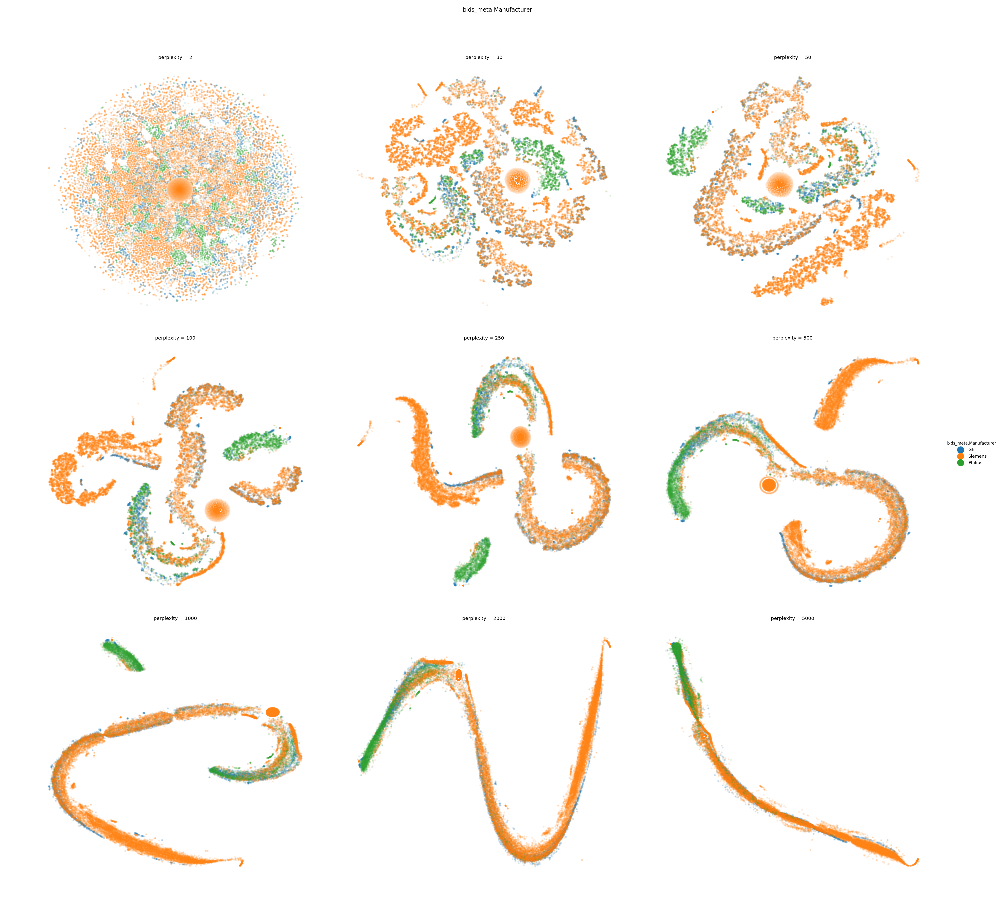

In [39]:
t1splot = sne_plot('bids_meta.Manufacturer',[2, 30, 50, 100, 250, 500, 1000, 2000, 5000], t1res_df, col_wrap=3)

## bold TSNE

In [19]:
def bold_run_tsne(pp):
    from sklearn.manifold import TSNE
    res = TSNE(n_iter=5000, perplexity=pp).fit_transform(bold_Xnn)
    return res

In [23]:
df_bold_unique = pd.read_csv('bold_datalad_and_mriqc.csv', low_memory=False)

# Split up collumns
bold_metric_columns = ['aqi',
                       'dummy_trs',
                       'dvars_nstd',
                       'dvars_std',
                       'dvars_vstd',
                       'efc',
                       'fber',
                       'fd_mean',
                       'fd_num',
                       'fd_perc',
                       'fwhm_avg',
                       'fwhm_x',
                       'fwhm_y',
                       'fwhm_z',
                       'gcor',
                       'gsr_x',
                       'gsr_y',
                       'size_t',
                       'size_x',
                       'size_y',
                       'size_z',
                       'snr',
                       'spacing_tr',
                       'spacing_x',
                       'spacing_y',
                       'spacing_z',
                       'summary_bg_k',
                       'summary_bg_mad',
                       'summary_bg_mean',
                       'summary_bg_median',
                       'summary_bg_n',
                       'summary_bg_p05',
                       'summary_bg_p95',
                       'summary_bg_stdv',
                       'summary_fg_k',
                       'summary_fg_mad',
                       'summary_fg_mean',
                       'summary_fg_median',
                       'summary_fg_n',
                       'summary_fg_p05',
                       'summary_fg_p95',
                       'summary_fg_stdv',
                       'tsnr']
bold_meta_columns =[l for l in df_bold_unique.columns 
                    if l not in metric_columns]

In [21]:
bold_X = df_bold_unique.loc[:, bold_metric_columns]
# Drop rows with null data
bold_notnull_mask = np.logical_and(bold_X.notnull().sum(1).astype(bool), np.logical_not(np.logical_not(np.isfinite(bold_X)).sum(1).astype(bool)))
bold_Xnn = bold_X.loc[bold_notnull_mask,:]

dview.push(dict(bold_Xnn=bold_Xnn))

bold_tsne_res = dview.map_async(bold_run_tsne, perplexities)

In [26]:
bold_tsne_res.status

['ok', 'ok', 'ok', 'ok', 'ok', 'ok', 'ok', 'ok', 'ok']

In [42]:
bold_res = bold_tsne_res.get()
bold_res_df = df_bold_unique.loc[bold_notnull_mask,bold_meta_columns]
# Rename the "CMI" dataset to the more informative, HBN (For healthy brain network)
bold_res_df.loc[bold_res_df.dataset=='cmi', 'dataset'] = 'hbn'

for pp, rr in zip(perplexities, bold_res):
    bold_res_df['x_%05d'%pp] = rr[:,0]
    bold_res_df['y_%05d'%pp] = rr[:,1]
    
bold_res_df.to_csv('bold_merge_datalad_with_tsnes.csv', index=None)

### Make TSNE Plots for T1w images
bold_merge_datalad_with_tsnes.csv is available to download from the OHBM2019-TSNE-Analysis directory here: https://osf.io/haf97/

In [46]:
bold_res_df = pd.read_csv('bold_merge_datalad_with_tsnes.csv')

In [47]:
# melt tsne results
melted = []
for pp in perplexities:
    tmp_df = bold_res_df.loc[:, bold_meta_columns + ['x_%05d'%pp, 'y_%05d'%pp]].copy()
    tmp_df['perplexity'] = pp
    tmp_df.rename({'x_%05d'%pp:'x', 'y_%05d'%pp:'y'}, axis=1, inplace=True)
    melted.append(tmp_df)
bold_res_df = pd.concat(melted).reset_index(drop=True)

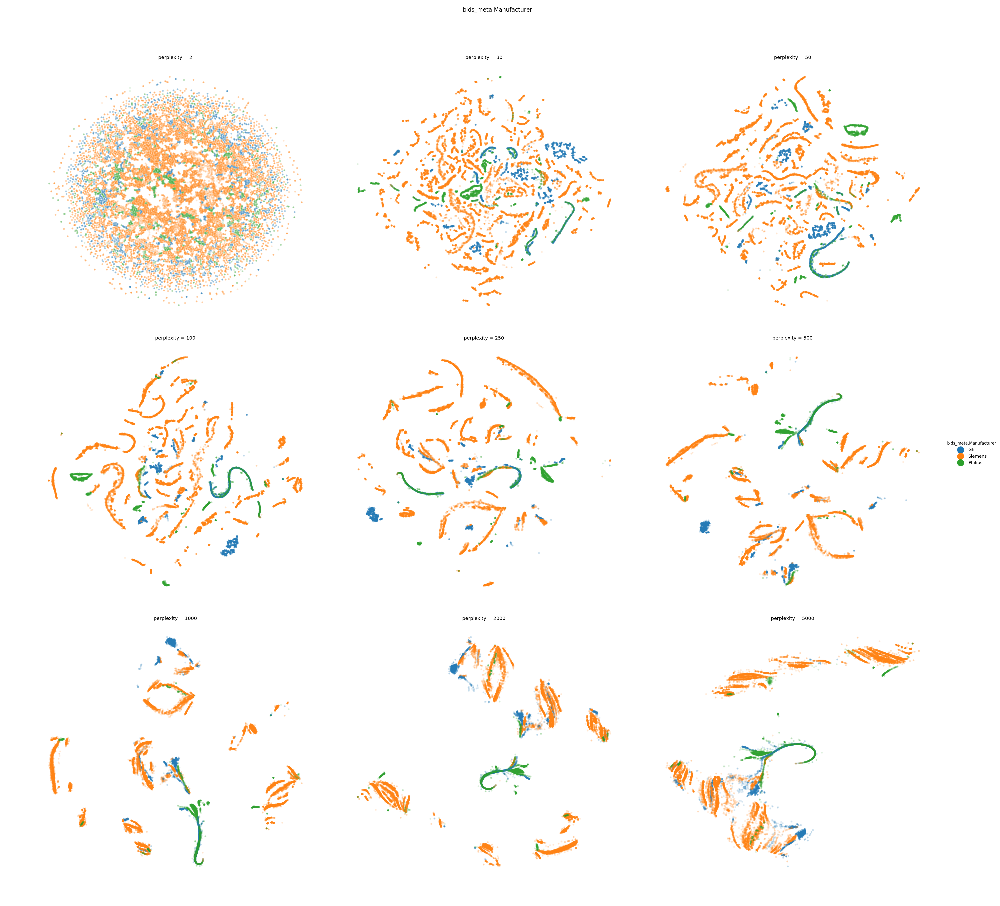

In [48]:
sne_plot('bids_meta.Manufacturer',[2, 30, 50, 100, 250, 500, 1000, 2000, 5000], bold_res_df,
         col_wrap=3,
        palette=t1splot._colors,
        hue_order=t1splot.hue_names,
        )

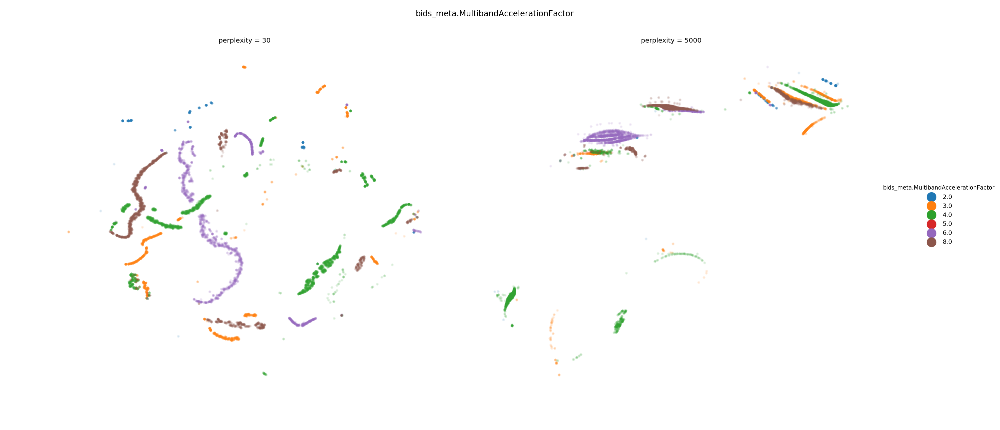

In [50]:
sne_plot('bids_meta.MultibandAccelerationFactor',[30, 5000], bold_res_df)

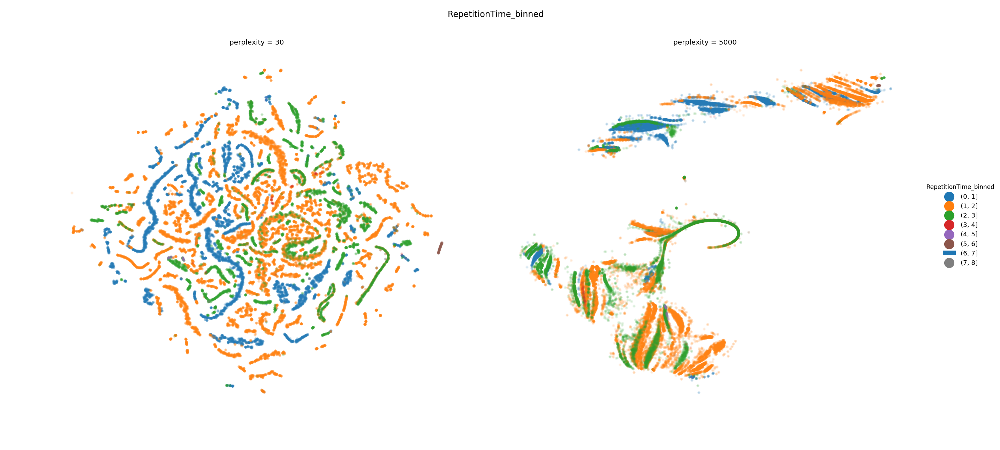

In [51]:
bold_res_df['RepetitionTime_binned'] = pd.cut(bold_res_df['bids_meta.RepetitionTime'], np.arange(0,9))
sne_plot('RepetitionTime_binned',[30, 5000], bold_res_df)

# Make plots showing both T1 and BOLD TSNEs

array([5., 5.])

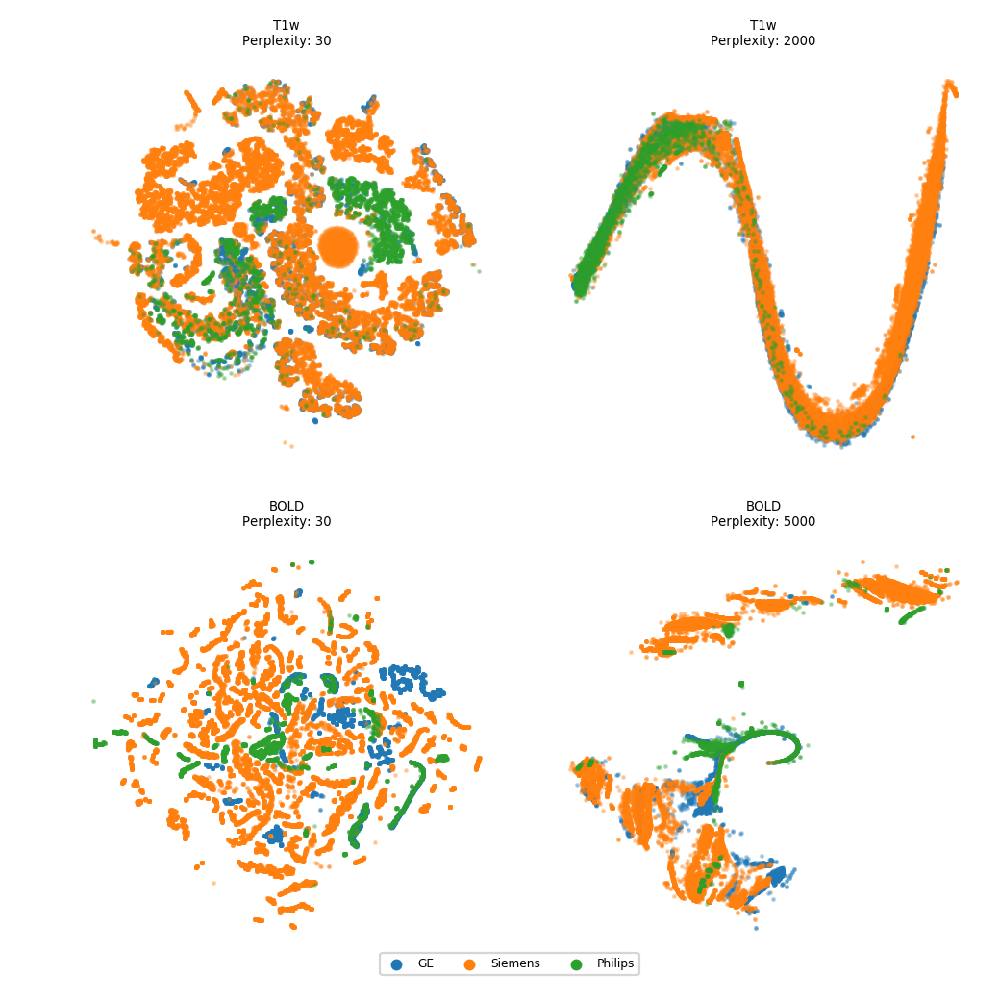

In [54]:
fig,axs = plt.subplots(2, 2, figsize=(5,5), dpi=200)
rowax = axs[0]
cp = sns.color_palette()
for axpp, ax in zip([30,2000], rowax):
    for ii, mfg in enumerate(res_df.loc[res_df['bids_meta.Manufacturer'].notnull(), 'bids_meta.Manufacturer'].unique()):
        axind = (res_df['bids_meta.Manufacturer'] == mfg) & (res_df['perplexity'] == axpp)
        ax.scatter(res_df.loc[axind, 'x'], res_df.loc[axind,'y'], marker='o', label=mfg, color=cp[ii], s=1, alpha=0.3)
        ax.set_axis_off()
        ax.set_title('T1w\nPerplexity: %d'%axpp)

rowax=axs[1]
for axpp, ax in zip([30,5000], rowax):
    for ii, mfg in enumerate(bold_res_df.loc[bold_res_df['bids_meta.Manufacturer'].notnull(), 'bids_meta.Manufacturer'].unique()):
        axind = (bold_res_df['bids_meta.Manufacturer'] == mfg) & (bold_res_df['perplexity'] == axpp)
        ax.scatter(bold_res_df.loc[axind, 'x'], bold_res_df.loc[axind,'y'], marker='o', label=mfg, color=cp[ii], s=1, alpha=0.3)
        ax.set_axis_off()
        ax.set_title('BOLD\nPerplexity: %d'%axpp)
leg =  axs[0][0].get_legend_handles_labels()

fl = fig.legend(*leg, loc='lower center', bbox_to_anchor=(0.53,0.02), ncol=3)
for lh in fl.legendHandles:
    try:
        lh.set_sizes([12.])
    except AttributeError:
        pass
    lh.set_alpha(1)
fig.tight_layout(pad=0)
fig.get_size_inches()
#fig.savefig('tsne__.png', bbox_inches="tight", dpi=300)

array([5., 5.])

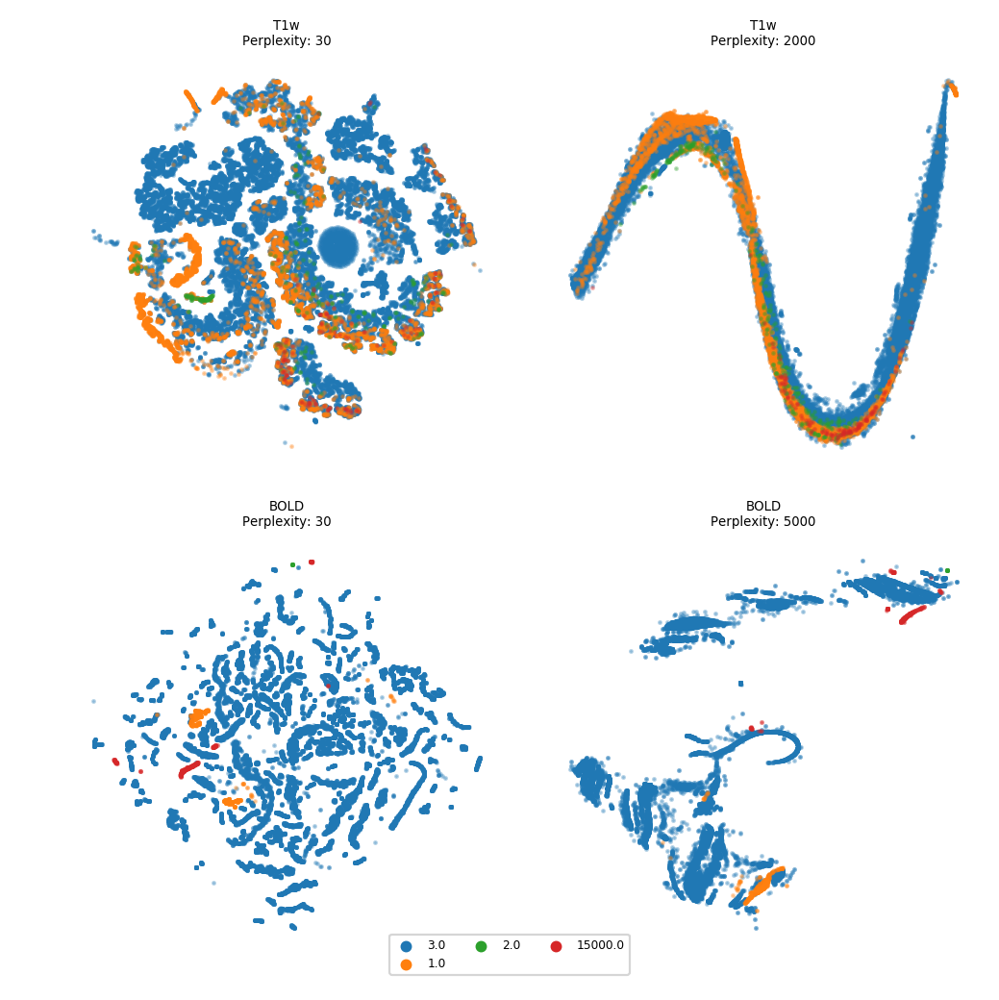

In [55]:
voe = 'bids_meta.MagneticFieldStrength'
fig,axs = plt.subplots(2, 2, figsize=(5,5), dpi=200)
rowax = axs[0]
cp = sns.color_palette()
for axpp, ax in zip([30,2000], rowax):
    for ii, mfg in enumerate(res_df.loc[res_df[voe].notnull(), voe].unique()):
        axind = (res_df[voe] == mfg) & (res_df['perplexity'] == axpp)
        ax.scatter(res_df.loc[axind, 'x'], res_df.loc[axind,'y'], marker='o', label=mfg, color=cp[ii], s=1, alpha=0.3)
        ax.set_axis_off()
        ax.set_title('T1w\nPerplexity: %d'%axpp)

rowax=axs[1]
for axpp, ax in zip([30,5000], rowax):
    for ii, mfg in enumerate(bold_res_df.loc[bold_res_df[voe].notnull(), voe].unique()):
        axind = (bold_res_df[voe] == mfg) & (bold_res_df['perplexity'] == axpp)
        ax.scatter(bold_res_df.loc[axind, 'x'], bold_res_df.loc[axind,'y'], marker='o', label=mfg, color=cp[ii], s=1, alpha=0.3)
        ax.set_axis_off()
        ax.set_title('BOLD\nPerplexity: %d'%axpp)
leg =  axs[0][0].get_legend_handles_labels()

fl = fig.legend(*leg, loc='lower center', bbox_to_anchor=(0.53,0.02), ncol=3)
for lh in fl.legendHandles:
    try:
        lh.set_sizes([12.])
    except AttributeError:
        pass
    lh.set_alpha(1)
fig.tight_layout(pad=0)
fig.get_size_inches()
#fig.savefig('tsne_fig1.png', bbox_inches="tight", dpi=300)

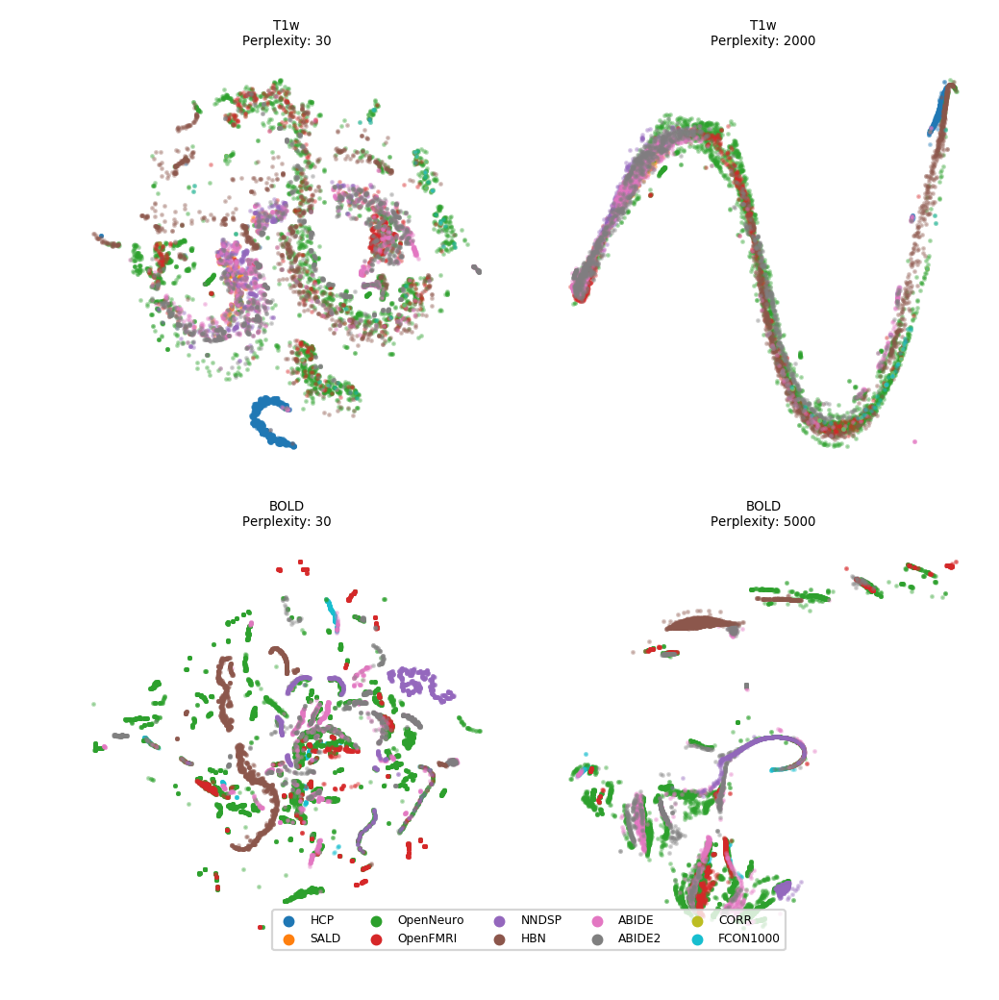

In [56]:
t1_dataset_order = [ 'hcp', 'sald', 'openneuro', 'openfmri',
                 'nndsp', 'hbn', 'abide', 'abide2', 'corr', 'fcon1000',]
bold_dataset_order = ['fcon1000',  'openneuro','openfmri',  'abide', 'abide2', 'hbn', 'nndsp']
cp = sns.color_palette()
cdict = {ds:color for ds, color in (zip(t1_dataset_order,cp))}


voe = 'dataset'
fig,axs = plt.subplots(2, 2, figsize=(5,5), dpi=200)
rowax = axs[0]

for axpp, ax in zip([30,2000], rowax):
    for ii, mfg in enumerate(t1_dataset_order):
        if mfg not in ['openfmri', 'openneuro']:
            label=mfg.upper()
        elif mfg == 'openfmri':
            label='OpenFMRI'
        elif mfg == 'openneuro':
            label='OpenNeuro'
        axind = (t1res_df[voe] == mfg) & (t1res_df['perplexity'] == axpp)
        ax.scatter(t1res_df.loc[axind, 'x'], res_df.loc[axind,'y'], marker='o', label=label, color=cdict[mfg], s=1, alpha=0.3)
        #print(ii)
        ax.set_axis_off()
        ax.set_title('T1w\nPerplexity: %d'%axpp)

rowax=axs[1]
for axpp, ax in zip([30,5000], rowax):
    for ii, mfg in enumerate(bold_dataset_order):
        axind = (bold_res_df[voe] == mfg) & (bold_res_df['perplexity'] == axpp)
        ax.scatter(bold_res_df.loc[axind, 'x'], bold_res_df.loc[axind,'y'], marker='o', label=mfg, color=cdict[mfg], s=1, alpha=0.3)
        #print(ii)
        ax.set_axis_off()
        ax.set_title('BOLD\nPerplexity: %d'%axpp)
leg =  axs[0][0].get_legend_handles_labels()

fl = fig.legend(*leg, loc='upper center', bbox_to_anchor=(0.55,0.1), ncol=5)
for lh in fl.legendHandles:
    try:
        lh.set_sizes([12.])
    except AttributeError:
        pass
    lh.set_alpha(1)
fig.tight_layout(pad = 0)
fig.get_size_inches()
fig.savefig('tsne_fig2.png', bbox_inches="tight", dpi=300)